# Rainfall Prediction - Weather Forecasting

## Problem Statement:

### Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
### 1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

# Importing Libraries

In [135]:
import pandas as pd
import numpy as np

# importing plotting libraries:
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

# Loading the dataset 

In [136]:
df1 = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df1

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [137]:
df1.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [138]:
df1.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [139]:
df1.sample(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3788,2016-02-11,Williamtown,15.3,28.4,0.0,7.2,NaN,SE,37.0,NNE,...,71.0,56.0,1015.0,1013.9,1.0,4.0,23.2,28.3,No,No
6044,2011-10-18,Melbourne,7.5,25.1,0.0,4.4,12.3,N,67.0,N,...,66.0,22.0,1031.2,1027.7,0.0,0.0,12.9,24.6,No,No
6187,2011-02-27,Brisbane,22.1,31.4,0.0,5.2,NaN,NNE,22.0,W,...,61.0,54.0,1013.7,1010.5,3.0,1.0,26.5,29.9,No,No
1045,2009-07-26,CoffsHarbour,8.4,18.9,0.0,1.8,2.4,NNW,37.0,N,...,67.0,65.0,1021.4,1016.6,7.0,7.0,15.9,16.3,No,No
7983,2014-01-11,PerthAirport,20.6,43.5,0.0,12.0,13.1,E,54.0,E,...,31.0,11.0,1015.9,1010.3,0.0,0.0,29.8,42.4,No,No
3018,2016-05-03,Williamtown,13.0,25.0,0.2,3.2,NaN,NW,59.0,NNW,...,70.0,45.0,1013.0,1008.2,NaN,1.0,20.3,24.9,No,No
1214,2010-01-11,CoffsHarbour,18.9,28.2,0.0,7.0,7.1,SSW,37.0,SSW,...,77.0,73.0,1017.0,1016.1,7.0,2.0,25.3,26.9,No,No
1359,2010-06-05,CoffsHarbour,14.9,21.7,1.8,2.4,7.8,SW,54.0,WSW,...,64.0,52.0,1009.6,1008.9,6.0,5.0,18.1,20.6,Yes,No
7824,2013-08-05,PerthAirport,13.2,22.2,5.0,3.4,6.8,WNW,54.0,NNE,...,90.0,58.0,1015.4,1013.7,7.0,6.0,16.1,21.4,Yes,Yes
5361,2009-11-04,Melbourne,11.4,18.1,0.0,6.8,3.7,SW,37.0,WSW,...,62.0,46.0,1019.5,1019.0,6.0,7.0,13.7,18.1,No,No


### df1 is our main dataset 

# Exploratory Data Analysis (EDA)

In [140]:
df1.shape

(8425, 23)

- We can see that our dataset is having 8425 rows and 23 columns

In [141]:
df1.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

- We can see the names of 23 columns of our dataset.

### Columns Description

Date - The date of observation

Location -The common name of the location of the weather station

MinTemp -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall -The amount of rainfall recorded for the day in mm

Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine -The number of hours of bright sunshine in the day.

WindGustDir- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am.

Cloud3pm -Fraction of sky obscured by cloud

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk"

In [142]:
# Let us check the datatypes of all the columns:
df1.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [143]:
# Lets us check the information and count of dtypes in the columns:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

##### As per above observations we can see that most of the columns i.e 16 are of float datatype and 7 are of object datatype.

##### Also as per shape we have 8425 rows but as per above observations we can see that there are some missing values in some columns.

### We will have to make 2 models, 1 to predict if tomorrow it will rain or not and 2nd model to predict that if it rains then what is the amount.

## Target variable for 1st model is 'RainTomorrow' which tells us that this is a classification model.

## Target variable for 2nd model is 'Rainfall' which tells us that this is a Regression model.

#### Let us seperate the numerical and object datatypes:

In [144]:
object_datatype=[]

for i in df1.dtypes.index:
    if df1.dtypes[i] == 'object':
        object_datatype.append(i)
object_datatype

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [145]:
numerical_datatype=[]

for i in df1.dtypes.index:
    if df1.dtypes[i] != 'object':
        numerical_datatype.append(i)
numerical_datatype

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

# Checking Null values

In [146]:
df1.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

From the above observation we can see that almost all columns have null values, So we have to use imputation technigues for removing

# Unique values

In [147]:
df1.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

- We can see that mostly all columns have unique values and very few have less unique values.

# Let us check the Duplicate values

In [148]:
df1.duplicated().sum()

1663

- We can see that there are 1663 duplicate values in our dataset.

In [149]:
df1 = df1[~df1.duplicated()]

In [150]:
df1.duplicated().sum()

0

- Now all the duplicate values are removed from the dataset.

In [151]:
df1.shape

(6762, 23)

- After removing duplicate values now we can see that we have only 6762 rows. 

In [152]:
# After removing the duplicate values i.e 1663 values, let us again check the sum of null values in the dataset.

df1.isnull().sum()

Date                0
Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
dtype: int64

#### The count of null values is reduced now.

In [153]:
# Let us check the value counts of all data:

for columns in df1:
    print(columns)
    print(df1[columns].value_counts())
    print("="*120)

Date
2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
Location
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64
MinTemp
13.2    58
12.0    57
14.8    53
12.7    53
10.8    52
        ..
26.6     1
28.0     1
26.9     1
1.4      1
26.0     1
Name: MinTemp, Length: 285, dtype: int64
MaxTemp
19.0    66
19.8    62
20.8    54
23.8    54
25.0    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64
Rainfall
0.0      4334
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
4

- We are able to see all the value counts of the columns in our dataset.

In [154]:
#Now We will convert date from object type to date type and then seperate day, month and year

df1['Date']=pd.to_datetime(df1['Date'])
df1["Day"] = df1['Date'].dt.day
df1["Month"] = df1['Date'].dt.month
df1["Year"] = df1['Date'].dt.year

In [155]:
df1.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [156]:
# Now we can drop date coloumn from our dataset

df1.drop("Date",axis=1,inplace=True)

In [157]:
df1.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [158]:
# As now we have converted date to day,month and year, so lets again check the datatypes and seperate them.

object_cols=[]

for i in df1.dtypes.index:
    if df1.dtypes[i] == 'object':
        object_cols.append(i)
object_cols

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [159]:
numerical_cols=[]

for i in df1.dtypes.index:
    if df1.dtypes[i] != 'object':
        numerical_cols.append(i)
numerical_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Day',
 'Month',
 'Year']

<AxesSubplot:>

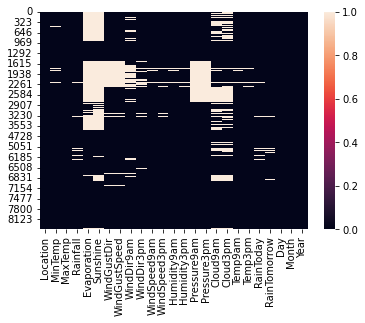

In [160]:
# Let us visualize the null values using heatmap:
sns.heatmap(df1.isnull())

# Filling the Missing data

#### We will fill the missing data of object columns by using mode and fill and impute the missing data of numerical columns by using IterativeImputer


In [161]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [162]:
df=pd.DataFrame()
df['WindGustDir'] = df1['WindGustDir'].fillna(df1['WindGustDir'].mode()[0])
df['WindDir9am'] = df1['WindDir9am'].fillna(df1['WindDir9am'].mode()[0])
df['WindDir3pm'] = df1['WindDir3pm'].fillna(df1['WindDir3pm'].mode()[0])
df['RainToday'] = df1['RainToday'].fillna(df1['RainToday'].mode()[0])
df['RainTomorrow']=df1['RainTomorrow'].fillna(df1['RainTomorrow'].mode()[0])
df['Location']=df1['Location']

# We have filled the missing data using NaN by mode method and replaced the object datatype values in new dataframe

In [163]:
df.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location
0,W,W,WNW,No,No,Albury
1,WNW,NNW,WSW,No,No,Albury
2,WSW,W,WSW,No,No,Albury
3,NE,SE,E,No,No,Albury
4,W,ENE,NW,No,No,Albury


In [164]:
## Now let us work on numerical data using IterativeImputer

imputer=IterativeImputer()
before_imputer=pd.DataFrame(df1[numerical_cols])

In [165]:
num_df=pd.DataFrame(imputer.fit_transform(before_imputer),columns=numerical_cols)
num_df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,13.4,22.900000,0.6,3.391685,7.130509,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.874826,16.9,21.8,1.0,12.0,2008.0
1,7.4,25.100000,0.0,4.149341,12.628322,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,1.135447,1.451345,17.2,24.3,2.0,12.0,2008.0
2,12.9,25.700000,0.0,5.872974,12.022633,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,2.268447,2.000000,21.0,23.2,3.0,12.0,2008.0
3,9.2,28.000000,0.0,3.771469,13.091641,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,0.505052,0.825362,18.1,26.5,4.0,12.0,2008.0
4,17.5,32.300000,1.0,3.909425,6.732299,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,5.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,2.8,23.400000,0.0,6.351080,11.113943,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,0.685550,1.589567,10.1,22.4,21.0,6.0,2017.0
6758,3.6,25.300000,0.0,6.025810,11.780452,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,0.577039,1.130006,10.9,24.5,22.0,6.0,2017.0
6759,5.4,26.900000,0.0,7.826086,11.551481,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,0.869720,1.639326,12.5,26.1,23.0,6.0,2017.0
6760,7.8,27.000000,0.0,8.048489,10.572988,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,24.0,6.0,2017.0


In [166]:
df[numerical_cols]=num_df[numerical_cols]

In [167]:
df.shape

(6762, 25)

In [168]:
# We have filled the missing data, now lets check if there is any more null values in the dataset.

df.isna().sum()

WindGustDir         0
WindDir9am          0
WindDir3pm          0
RainToday           0
RainTomorrow        0
Location            0
MinTemp          1663
MaxTemp          1663
Rainfall         1663
Evaporation      1663
Sunshine         1663
WindGustSpeed    1663
WindSpeed9am     1663
WindSpeed3pm     1663
Humidity9am      1663
Humidity3pm      1663
Pressure9am      1663
Pressure3pm      1663
Cloud9am         1663
Cloud3pm         1663
Temp9am          1663
Temp3pm          1663
Day              1663
Month            1663
Year             1663
dtype: int64

In [169]:
df.dropna(inplace=True)
df.shape

(5099, 25)

- We have removed all the null values from our dataset.

<AxesSubplot:>

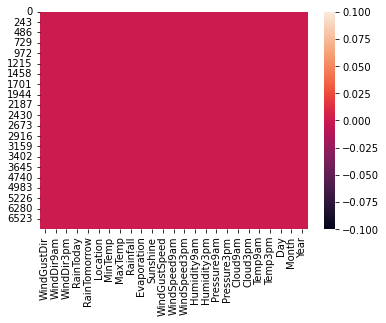

In [170]:
# after fill the data let us visualize it using heatmap:

sns.heatmap(df.isnull())

# Statistical Data:

In [171]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000
mean,13.231671,24.289810,2.972852,5.042197,7.637339,35.782072,10.955284,16.272512,68.798638,51.542999,1017.919130,1015.236412,4.123839,4.087723,18.135165,22.907714,15.713473,6.486174,2012.359090
std,5.709350,6.043582,11.562253,4.138295,3.544560,14.025849,8.908270,9.502578,17.186019,18.909754,5.784347,5.766437,2.663766,2.510292,5.741795,5.898366,8.804694,3.339076,2.509672
min,-2.000000,8.200000,-5.249726,-4.734647,-1.808800,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,-1.594208,-3.591006,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.000000,19.800000,0.000000,2.823983,5.043133,26.000000,4.000000,9.000000,57.000000,38.000000,1014.500000,1011.600000,1.788714,2.000000,14.200000,18.600000,8.000000,4.000000,2010.000000
50%,13.400000,23.800000,0.000000,4.774293,8.052189,33.000000,9.000000,15.000000,69.000000,51.960484,1018.257752,1015.600000,4.000000,4.000000,18.300000,22.500000,16.000000,6.000000,2012.000000
75%,17.800000,28.500000,1.000000,6.813850,10.300000,44.000000,17.000000,22.000000,82.000000,64.000000,1021.326239,1018.600000,7.000000,6.000000,22.400000,26.900000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,19.032238,155.615144,59.430598,83.000000,100.000000,99.000000,1038.700000,1036.000000,9.739352,10.238721,39.400000,44.100000,31.000000,12.000000,2017.000000


### Observations:

1. Count of all columns is now equal i.e 5099.
2. We can see that there are some negative values also.

# Skewness:

In [172]:
df.skew()

MinTemp          -0.151957
MaxTemp           0.280303
Rainfall         13.200419
Evaporation       9.429953
Sunshine         -0.235807
WindGustSpeed     0.985307
WindSpeed9am      1.013483
WindSpeed3pm      0.708957
Humidity9am      -0.307762
Humidity3pm       0.082823
Pressure9am      -0.142429
Pressure3pm      -0.111530
Cloud9am          0.001963
Cloud3pm          0.074901
Temp9am          -0.179337
Temp3pm           0.319601
Day               0.010392
Month             0.027847
Year              0.069623
dtype: float64

# Checking Outliers

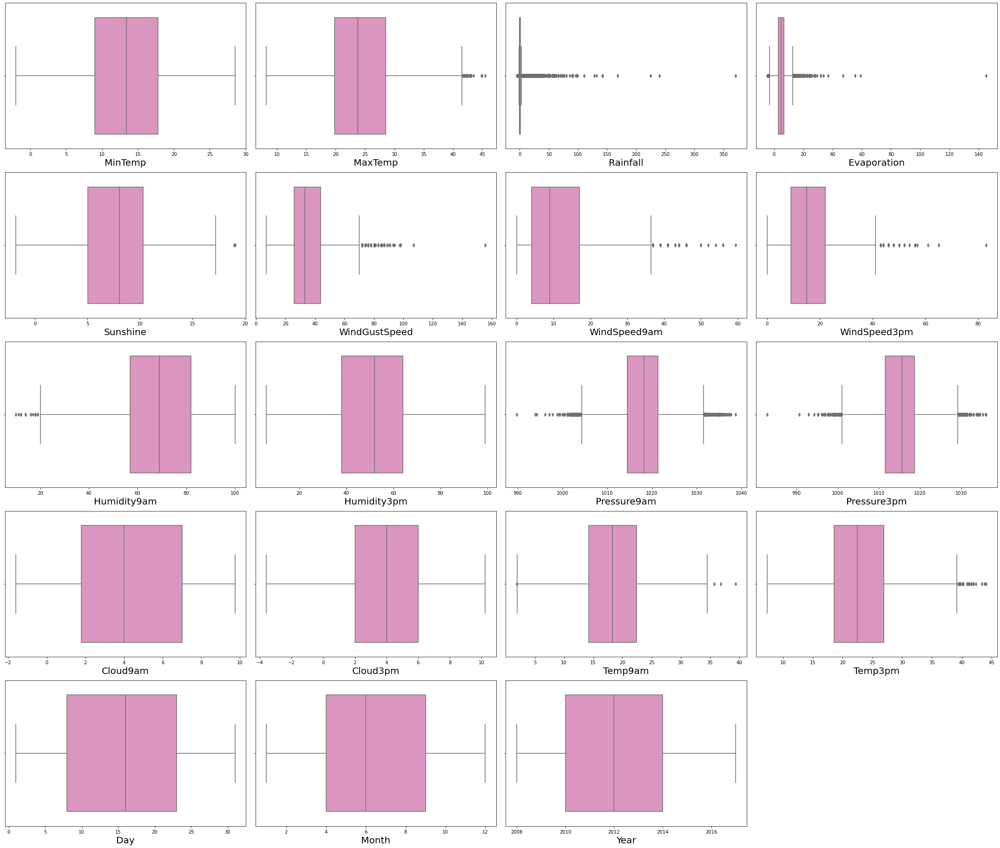

In [173]:
plt.figure(figsize=(30,30),facecolor='white')
plotnumber=1
for column in numerical_cols:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column],palette="Set2_r")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

Outliers are present in below columns:
    
    1. MaxTemp
    2. Rainfall
    3. Evaporation
    4. WindGustSpeed
    5. WindSpeed9am
    6. WindSpeed3pm
    7. Humidity9am
    8. Pressure9am
    9. Pressure3pm
    10. Temp9am
    11. Temp3pm
    12. Sunshine

# Removing Outliers using z-score

In [174]:
features=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z  

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.229987,0.205244,0.398878,0.143002,0.585970,1.015416,0.813279,0.128103,1.766860,1.411133,0.215139,0.187819
1,0.134071,0.257142,0.215776,1.408207,0.585970,0.780844,0.602789,1.443096,1.265458,1.289729,0.162886,0.236069
2,0.233360,0.257142,0.200773,1.237311,0.728578,0.903150,1.023769,1.792251,1.784150,1.133638,0.498993,0.049559
3,0.613966,0.257142,0.307096,1.538932,0.840108,0.005020,0.765395,1.384903,0.055177,0.422557,0.006125,0.609090
4,1.325534,0.170645,0.273756,0.255357,0.372059,0.444045,0.392299,0.768221,1.230878,1.601911,0.058379,1.151667
...,...,...,...,...,...,...,...,...,...,...,...,...
6757,0.147247,0.257142,0.316316,0.980924,0.340981,0.229553,0.554905,1.035748,1.155104,0.878200,1.399554,0.086085
6758,0.167167,0.257142,0.237709,1.168980,0.982716,0.229553,0.765395,0.744785,0.964917,0.670079,1.260211,0.269980
6759,0.431937,0.257142,0.672780,1.104376,0.086843,0.219512,0.765395,0.919363,0.532674,0.271180,0.981525,0.541268
6760,0.448485,0.257142,0.726528,0.828294,0.554892,0.229553,0.975885,1.035748,0.256038,0.219150,0.528661,0.524313


In [175]:
# Creating new dataframe
df_new = df[(z<3).all(axis=1)] 
df_new

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Rainfall,Evaporation,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,W,W,WNW,No,No,Albury,13.4,22.900000,0.6,3.391685,...,22.0,1007.7,1007.1,8.000000,4.874826,16.9,21.8,1.0,12.0,2008.0
1,WNW,NNW,WSW,No,No,Albury,7.4,25.100000,0.0,4.149341,...,25.0,1010.6,1007.8,1.135447,1.451345,17.2,24.3,2.0,12.0,2008.0
2,WSW,W,WSW,No,No,Albury,12.9,25.700000,0.0,5.872974,...,30.0,1007.6,1008.7,2.268447,2.000000,21.0,23.2,3.0,12.0,2008.0
3,NE,SE,E,No,No,Albury,9.2,28.000000,0.0,3.771469,...,16.0,1017.6,1012.8,0.505052,0.825362,18.1,26.5,4.0,12.0,2008.0
4,W,ENE,NW,No,No,Albury,17.5,32.300000,1.0,3.909425,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,5.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,N,N,N,No,No,Adelaide,2.8,23.400000,0.0,6.351080,...,24.0,1024.6,1020.3,0.685550,1.589567,10.1,22.4,21.0,6.0,2017.0
6758,WNW,NNE,N,No,Yes,Adelaide,3.6,25.300000,0.0,6.025810,...,21.0,1023.5,1019.1,0.577039,1.130006,10.9,24.5,22.0,6.0,2017.0
6759,WSW,SSW,SW,Yes,Yes,Adelaide,5.4,26.900000,0.0,7.826086,...,24.0,1021.0,1016.8,0.869720,1.639326,12.5,26.1,23.0,6.0,2017.0
6760,WSW,S,W,Yes,No,Adelaide,7.8,27.000000,0.0,8.048489,...,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,24.0,6.0,2017.0


In [176]:
# Total Data Loss 
dataloss=((5099-4789)/5099)*100

In [177]:
dataloss

6.079623455579526

- We can see that our 6% of data is lost now after reomving the outliers.

### Previously we checked the skewness and now lets plot the graph for the skewness.

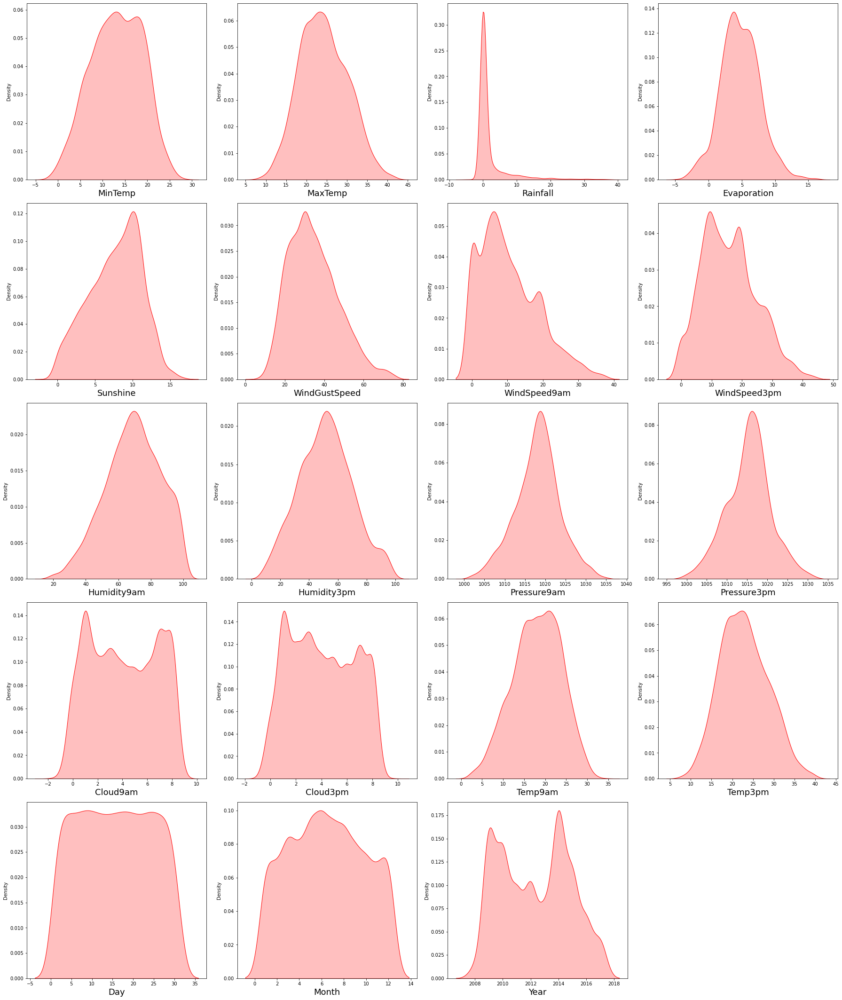

In [178]:
plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_cols:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df_new[column],color="red",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

- Rainfall column contains high skewness.

In [179]:
df_new.skew()

MinTemp         -0.137773
MaxTemp          0.197290
Rainfall         3.650157
Evaporation      0.174545
Sunshine        -0.288996
WindGustSpeed    0.601910
WindSpeed9am     0.756993
WindSpeed3pm     0.426798
Humidity9am     -0.273921
Humidity3pm      0.098996
Pressure9am     -0.109561
Pressure3pm     -0.077155
Cloud9am         0.024393
Cloud3pm         0.096084
Temp9am         -0.209469
Temp3pm          0.243698
Day              0.009663
Month            0.033661
Year             0.083311
dtype: float64

# Removing Skewness using yeo-johnson method

In [180]:
skewness=['Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm']

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

df_new[skewness] = scaler.fit_transform(df_new[skewness].values)
df_new[skewness].head()

,Rainfall,Evaporation,WindGustSpeed,WindSpeed9am,WindSpeed3pm
0,0.048555,-0.449326,0.803420,1.112653,0.930441
1,-0.465737,-0.191372,0.803420,-0.668855,0.738956
2,-0.465737,0.390325,0.934713,1.031915,1.116634
3,-0.465737,-0.319826,-0.826674,0.282632,-0.698347
4,0.281386,-0.272886,0.598279,-0.203514,0.541547


In [181]:
df_new[skewness].skew()

Rainfall        -4.981502
Evaporation      0.086263
WindGustSpeed   -0.012794
WindSpeed9am    -0.132963
WindSpeed3pm    -0.077357
dtype: float64

Skewness have been reduced after using powertransformer, We can see that 'Rainfall' column is one of our Label column so we can proceed

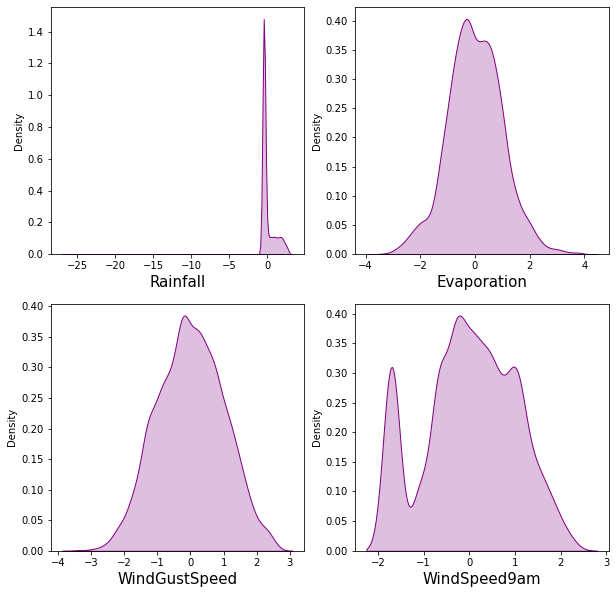

In [182]:
# After removing skewness let's check how the data has been distributed in each column.

plt.figure(figsize=(10,10), facecolor='white')
plotnumber = 1

for column in df_new[skewness]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(df_new[column],color='purple',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

In [183]:
# Removing skewness using square root method
df_new["Rainfall"] = np.cbrt(df_new["Rainfall"])

In [184]:
df_new.skew()

MinTemp         -0.137773
MaxTemp          0.197290
Rainfall         1.096926
Evaporation      0.086263
Sunshine        -0.288996
WindGustSpeed   -0.012794
WindSpeed9am    -0.132963
WindSpeed3pm    -0.077357
Humidity9am     -0.273921
Humidity3pm      0.098996
Pressure9am     -0.109561
Pressure3pm     -0.077155
Cloud9am         0.024393
Cloud3pm         0.096084
Temp9am         -0.209469
Temp3pm          0.243698
Day              0.009663
Month            0.033661
Year             0.083311
dtype: float64

Skewness is removed now for rainfall column also.

# Visualization of Data

#### Countplot

In [185]:
object_cols

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

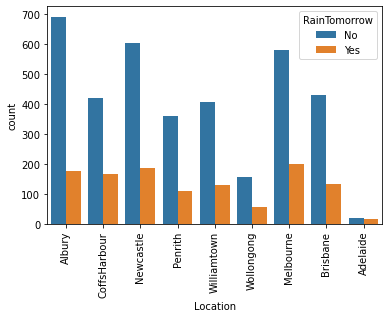

In [186]:
sns.countplot(df_new['Location'],hue=df_new['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

- We can see that there is chances of rainfall tomorrow at Melbourne, Newcastle, Albury, CoffsHarbour. 

E      1085
N       356
SSE     349
W       315
S       307
WNW     294
SE      288
SW      277
WSW     254
NE      230
NNE     230
SSW     207
ENE     200
NW      170
ESE     152
NNW     125
Name: WindGustDir, dtype: int64


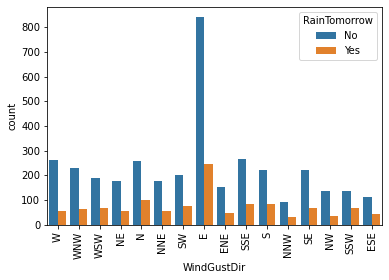

In [187]:
print(df_new['WindGustDir'].value_counts())
sns.countplot(df_new['WindGustDir'],hue=df_new['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

- WindGustDirection is mostly in East direction as it has higher count in East Direction.

N      1195
SW      513
NW      407
WSW     331
SE      303
SSW     281
W       253
WNW     229
SSE     227
S       219
NE      196
NNE     158
NNW     156
E       127
ENE     122
ESE     122
Name: WindDir9am, dtype: int64


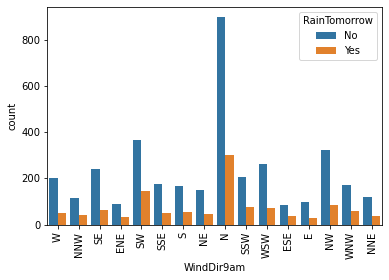

In [188]:
print(df_new['WindDir9am'].value_counts())
sns.countplot(df_new['WindDir9am'],hue=df_new['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

- WindDir9am will be high at North direction

SE     882
S      427
NE     416
SSE    346
N      276
NW     274
ESE    262
WNW    249
ENE    245
NNE    237
E      231
W      231
WSW    227
SW     203
SSW    201
NNW    132
Name: WindDir3pm, dtype: int64


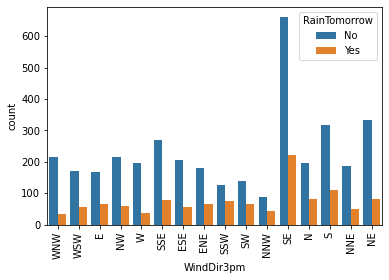

In [189]:
print(df_new['WindDir3pm'].value_counts())
sns.countplot(df_new['WindDir3pm'],hue=df_new['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

- Winddirection at 3pm will be high at southeast direction.

#### Scatterplot

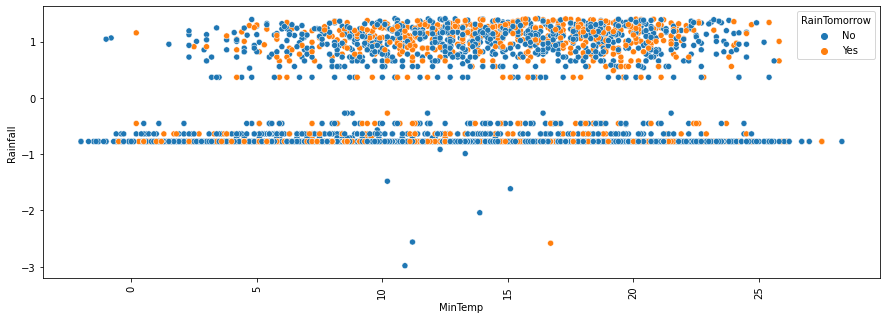

In [190]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['MinTemp'],df_new['Rainfall'],hue=df_new['RainTomorrow'])
plt.show()

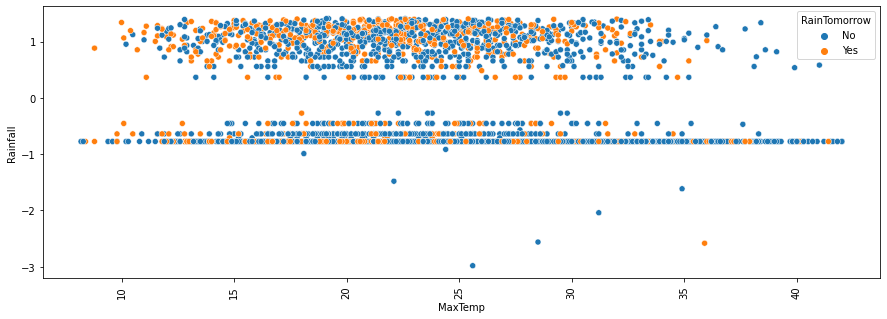

In [191]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['MaxTemp'],df_new['Rainfall'],hue=df_new['RainTomorrow'])
plt.show()

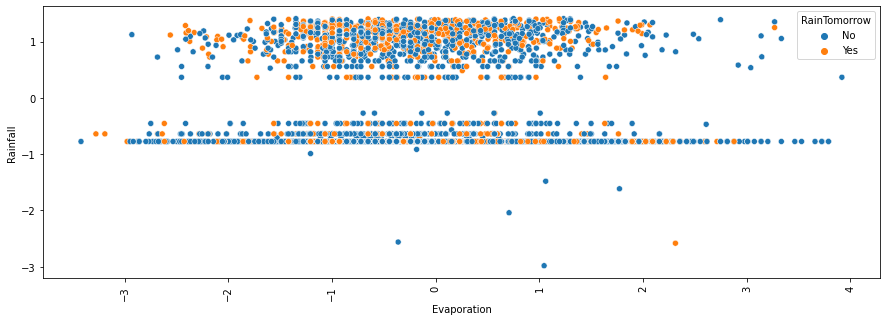

In [192]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['Evaporation'],df_new['Rainfall'],hue=df_new['RainTomorrow'])
plt.show()

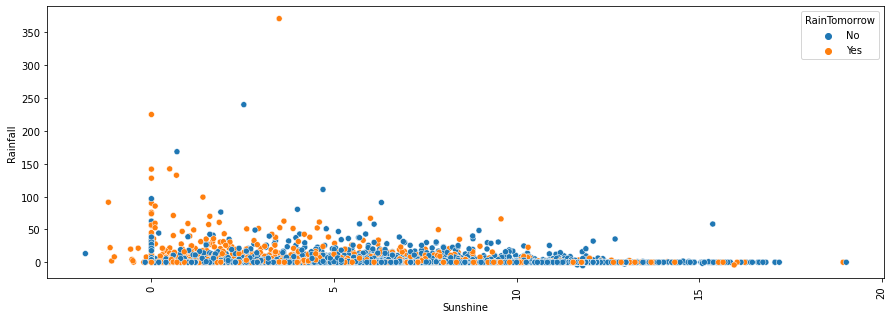

In [193]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['Sunshine'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

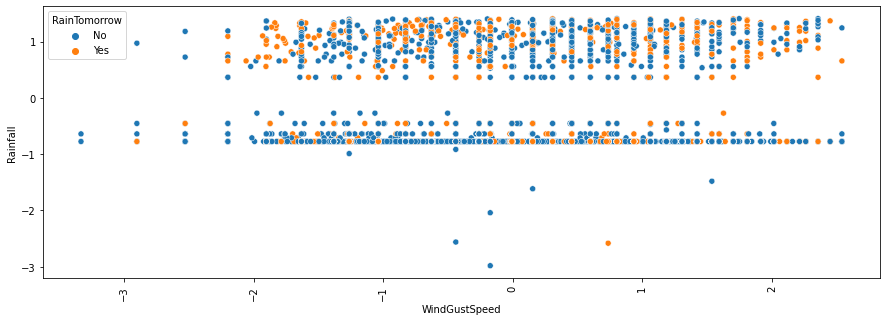

In [194]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['WindGustSpeed'],df_new['Rainfall'],hue=df_new['RainTomorrow'])
plt.show()

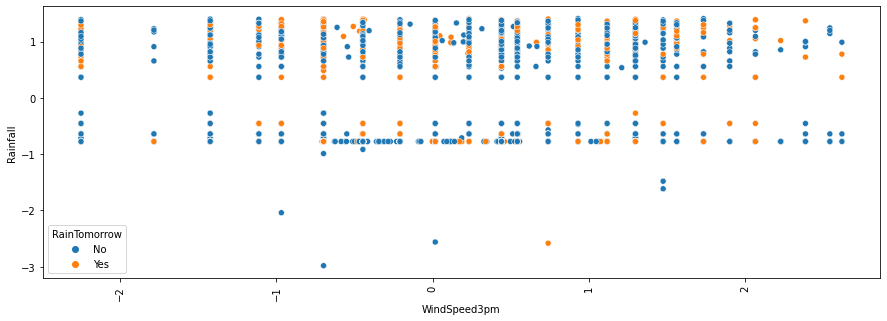

In [195]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['WindSpeed3pm'],df_new['Rainfall'],hue=df_new['RainTomorrow'])
plt.show()

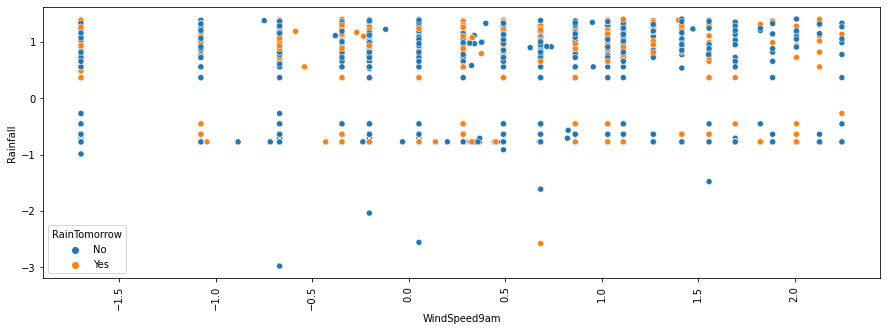

In [196]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['WindSpeed9am'],df_new['Rainfall'],hue=df_new['RainTomorrow'])
plt.show()

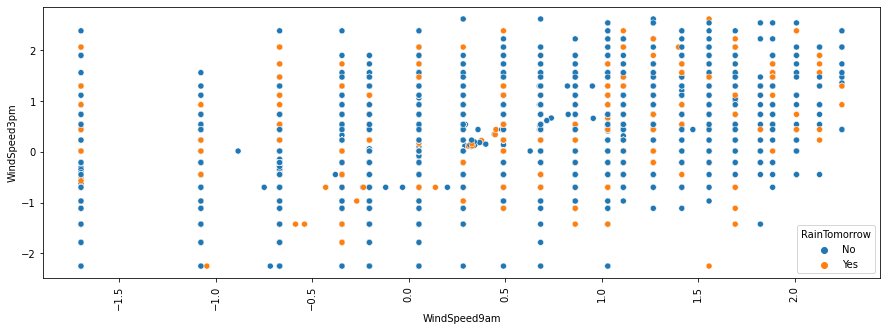

In [197]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['WindSpeed9am'],df_new['WindSpeed3pm'],hue=df_new['RainTomorrow'])
plt.show()

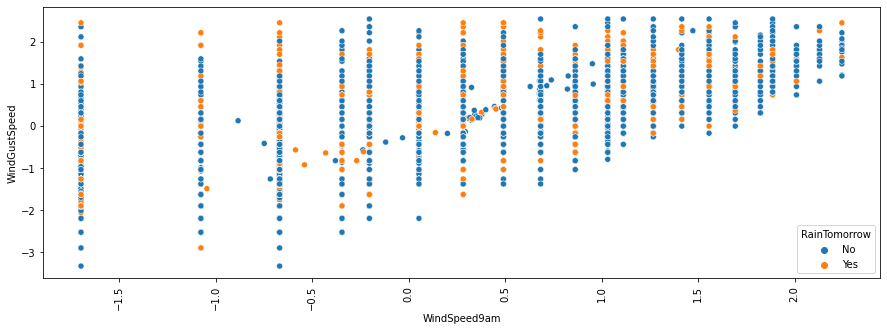

In [198]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df_new['WindSpeed9am'],df_new['WindGustSpeed'],hue=df_new['RainTomorrow'])
plt.show()

#### Pie Chart

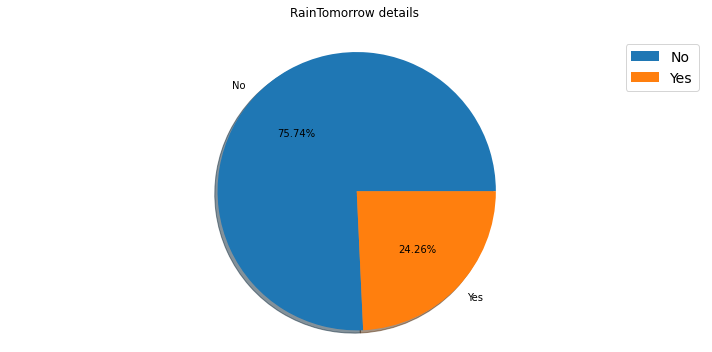

In [199]:
plt.figure(figsize=(10,5))
plt.pie(df_new['RainTomorrow'].value_counts(), labels=df_new['RainTomorrow'].value_counts().index, 
        shadow=True, autopct='%1.2f%%')
plt.title('RainTomorrow details \n')
plt.legend(prop={'size':14})
plt.axis('equal')
plt.tight_layout()
plt.show()

- We can see that there is only 24.26% chances of rain tomorrow.

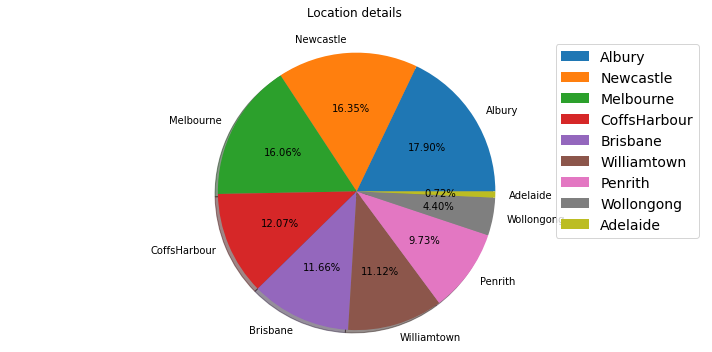

In [200]:
plt.figure(figsize=(10,5))
plt.pie(df_new['Location'].value_counts(), labels=df_new['Location'].value_counts().index, 
        shadow=True, autopct='%1.2f%%')
plt.title('Location details \n')
plt.legend(prop={'size':14})
plt.axis('equal')
plt.tight_layout()
plt.show()

- We can see that 17.90% of data is of Albury

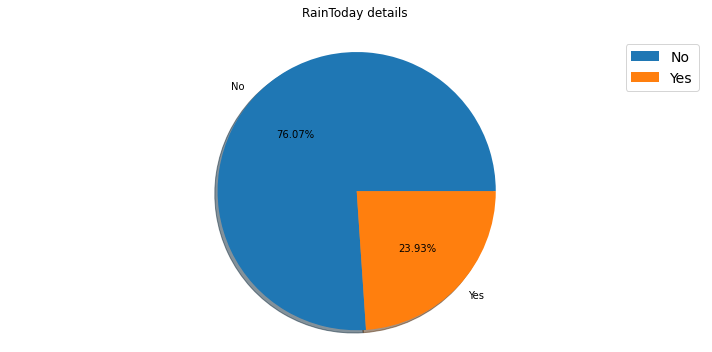

In [201]:
plt.figure(figsize=(10,5))
plt.pie(df_new['RainToday'].value_counts(), labels=df_new['RainToday'].value_counts().index, 
        shadow=True, autopct='%1.2f%%')
plt.title('RainToday details \n')
plt.legend(prop={'size':14})
plt.axis('equal')
plt.tight_layout()
plt.show()

- We can see that raintoday and raintomorrow have almost same predictions.

#### Lineplot

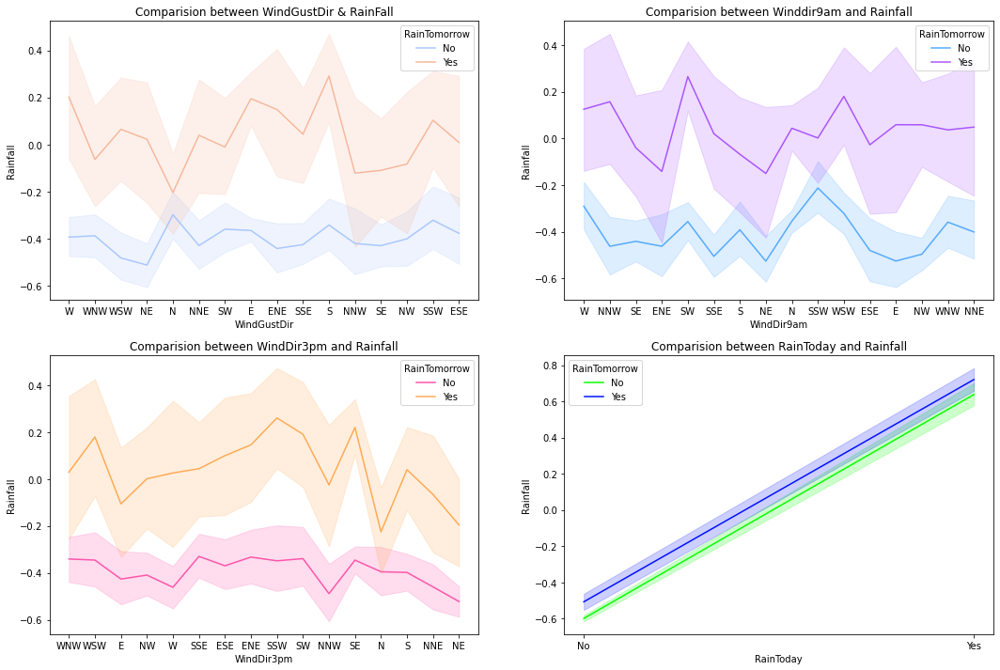

In [202]:
plt.figure(figsize=[18,12])

plt.subplot(2,2,1)
plt.title('Comparision between WindGustDir & RainFall')
sns.lineplot(df_new['WindGustDir'],df_new['Rainfall'],hue=df_new['RainTomorrow'],palette='coolwarm')

plt.subplot(2,2,2)
plt.title('Comparision between Winddir9am and Rainfall')
sns.lineplot(df_new['WindDir9am'],df_new['Rainfall'],hue=df_new['RainTomorrow'],palette='cool')

plt.subplot(2,2,3)
plt.title('Comparision between WindDir3pm and Rainfall')
sns.lineplot(df_new['WindDir3pm'],df_new['Rainfall'],hue=df_new['RainTomorrow'],palette='spring')

plt.subplot(2,2,4)
plt.title('Comparision between RainToday and Rainfall')
sns.lineplot(df_new['RainToday'],df_new['Rainfall'],hue=df_new['RainTomorrow'],palette='hsv')
plt.show()

- RainToday and Rainfall has linear relation.
- If WindGustDir is from south then there is high chance of rainfall.
- If WindDir3pm is from SSW to SE then there is high chance of rainfall.
- If WindDir9am is from SW then there is high chance of rainfall.

#### Pairplot

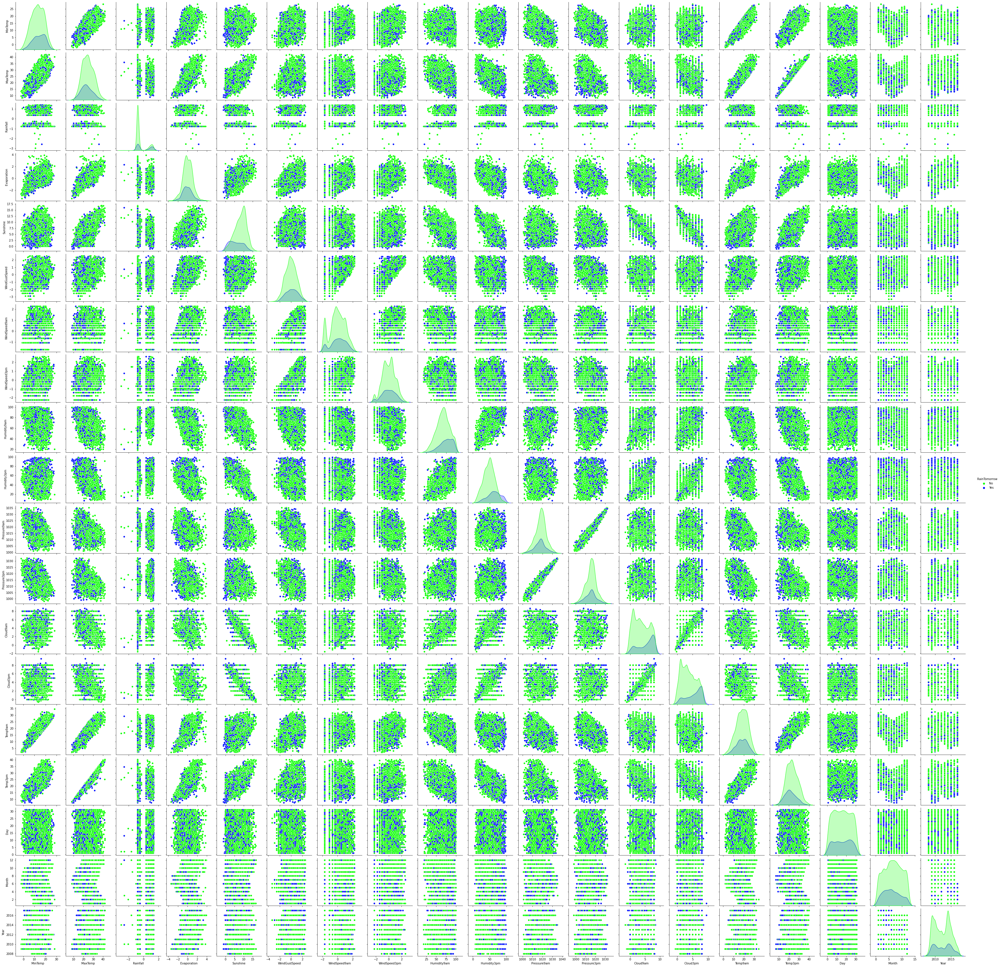

In [203]:
sns.pairplot(df_new,palette='hsv',hue='RainTomorrow')
plt.show()

### Observations:

1. High relation between rainfall and RainTomorrow.
2. If it rains Today then Chances of raining tomorrow is less.
3. There are also Some linear relationships.
4. We can see that Wind Direction have an influence on rainfall.

#### Distribution plot

<AxesSubplot:xlabel='MinTemp', ylabel='Density'>

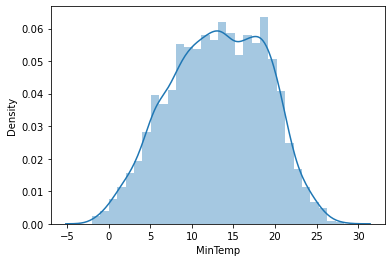

In [204]:
sns.distplot(df_new['MinTemp'])

<AxesSubplot:xlabel='MaxTemp', ylabel='Density'>

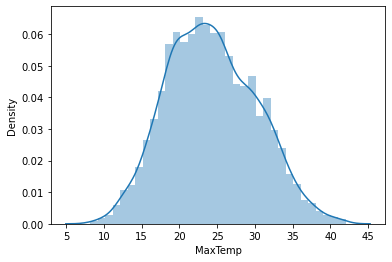

In [205]:
sns.distplot(df_new['MaxTemp'])

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

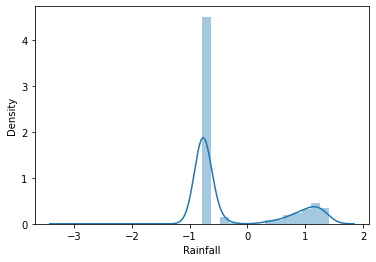

In [206]:
sns.distplot(df_new['Rainfall'])

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

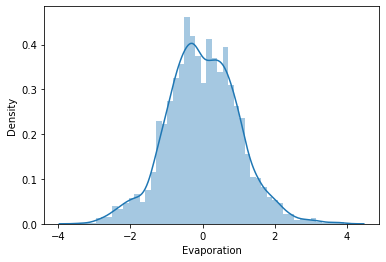

In [207]:
sns.distplot(df_new['Evaporation'])

<AxesSubplot:xlabel='Sunshine', ylabel='Density'>

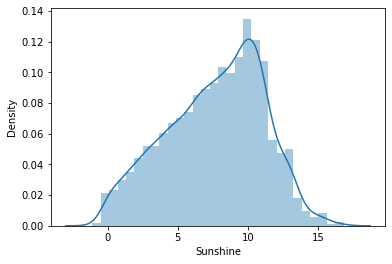

In [208]:
sns.distplot(df_new['Sunshine'])

<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

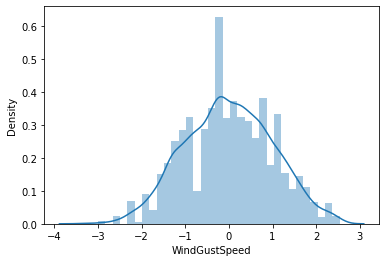

In [209]:
sns.distplot(df_new['WindGustSpeed'])

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

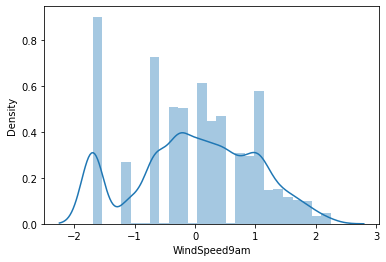

In [210]:
sns.distplot(df_new['WindSpeed9am'])

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Density'>

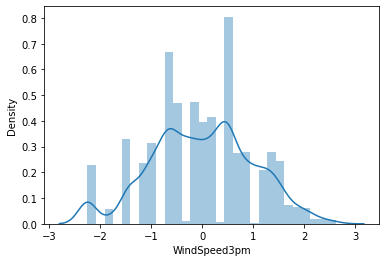

In [211]:
sns.distplot(df_new['WindSpeed3pm'])

<AxesSubplot:xlabel='Humidity9am', ylabel='Density'>

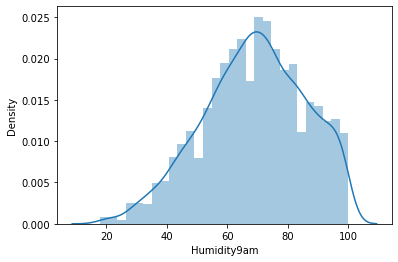

In [212]:
sns.distplot(df_new['Humidity9am'])

<AxesSubplot:xlabel='Humidity3pm', ylabel='Density'>

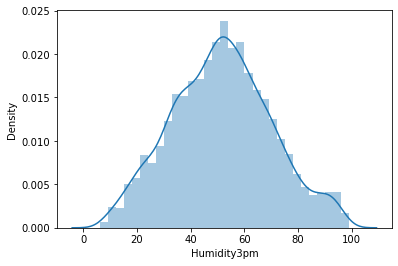

In [213]:
sns.distplot(df_new['Humidity3pm'])

<AxesSubplot:xlabel='Pressure9am', ylabel='Density'>

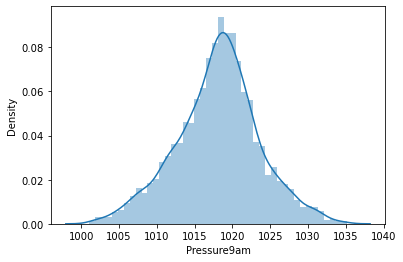

In [214]:
sns.distplot(df_new['Pressure9am'])

<AxesSubplot:xlabel='Pressure3pm', ylabel='Density'>

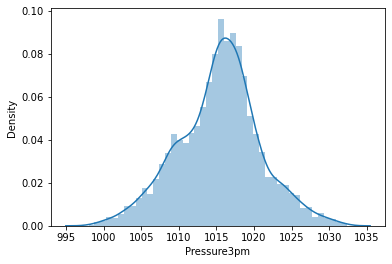

In [215]:
sns.distplot(df_new['Pressure3pm'])

<AxesSubplot:xlabel='Cloud9am', ylabel='Density'>

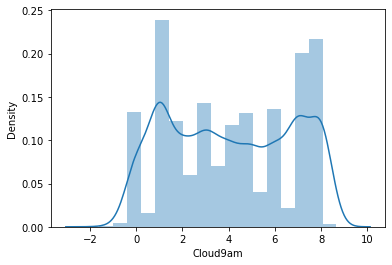

In [216]:
sns.distplot(df_new['Cloud9am'])

<AxesSubplot:xlabel='Cloud3pm', ylabel='Density'>

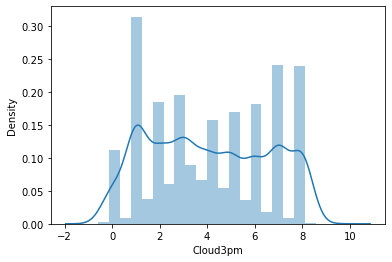

In [217]:
sns.distplot(df_new['Cloud3pm'])

<AxesSubplot:xlabel='Temp9am', ylabel='Density'>

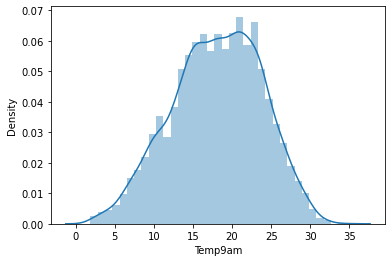

In [218]:
sns.distplot(df_new['Temp9am'])

<AxesSubplot:xlabel='Temp3pm', ylabel='Density'>

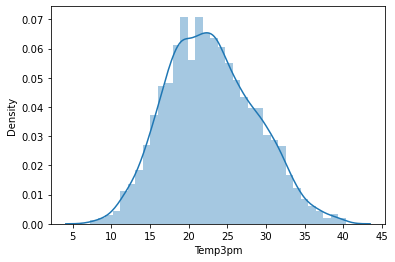

In [219]:
sns.distplot(df_new['Temp3pm'])

<AxesSubplot:xlabel='Day', ylabel='Density'>

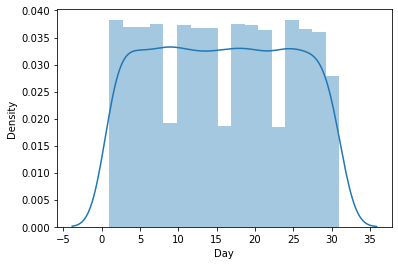

In [220]:
sns.distplot(df_new['Day'])

<AxesSubplot:xlabel='Month', ylabel='Density'>

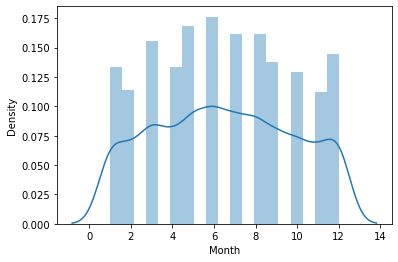

In [221]:
sns.distplot(df_new['Month'])

<AxesSubplot:xlabel='Year', ylabel='Density'>

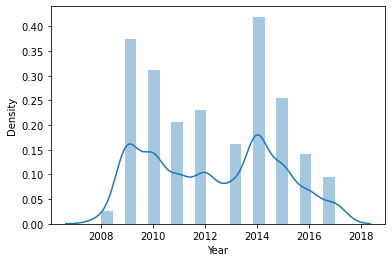

In [222]:
sns.distplot(df_new['Year'])

#### Histogram

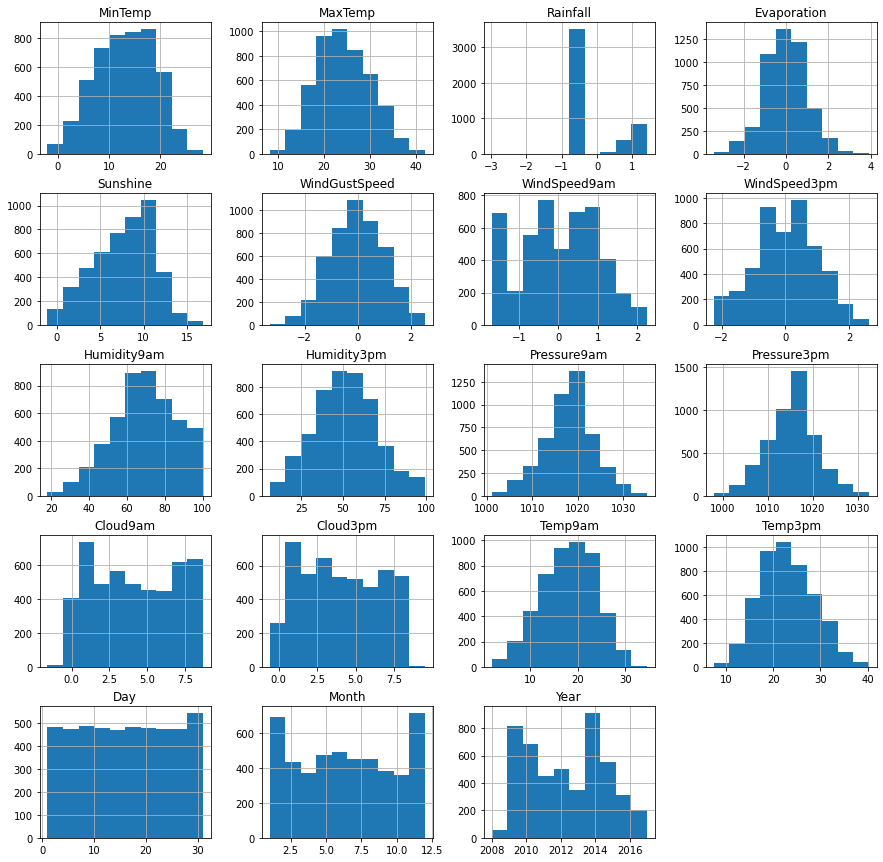

In [223]:
df_new.hist(figsize=(15,15))
plt.show()

# Encoding the categorical columns using Label Encoding

In [224]:
from sklearn.preprocessing import LabelEncoder

LE=LabelEncoder()
df_new[object_cols]= df_new[object_cols].apply(LE.fit_transform)

# Correlation

In [225]:
df_new.corr()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Rainfall,Evaporation,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
WindGustDir,1.000000,0.367967,0.393584,0.071513,0.006166,-0.147793,-0.081854,-0.069394,-0.017777,-0.046661,...,-0.111734,-0.086622,-0.052079,0.009259,-0.018267,-0.072270,-0.067763,0.000404,0.021164,-0.212247
WindDir9am,0.367967,1.000000,0.201090,0.122139,-0.007133,-0.021021,0.069061,-0.024063,0.046053,0.102758,...,-0.033417,-0.058537,-0.013349,-0.003938,0.004311,0.075152,-0.025337,-0.021223,0.017524,-0.039959
WindDir3pm,0.393584,0.201090,1.000000,0.083341,-0.017381,-0.050372,-0.143353,-0.157298,0.042125,-0.045528,...,-0.034395,-0.026644,0.030035,0.043943,0.032016,-0.164988,-0.160667,-0.001424,0.032329,-0.021169
RainToday,0.071513,0.122139,0.083341,1.000000,0.294971,0.010212,0.102598,-0.139564,0.670205,-0.057430,...,0.275839,-0.032336,0.016307,0.268806,0.240204,-0.028751,-0.143006,0.001433,-0.048330,0.018636
RainTomorrow,0.006166,-0.007133,-0.017381,0.294971,1.000000,0.012833,0.096017,-0.099118,0.240868,-0.046788,...,0.339144,-0.037336,-0.015301,0.243258,0.294422,0.004357,-0.127703,0.003060,-0.052404,0.020604
Location,-0.147793,-0.021021,-0.050372,0.010212,0.012833,1.000000,0.109190,-0.042359,0.079019,0.239948,...,0.188513,0.073166,0.086926,0.115216,0.143629,0.063952,-0.054065,-0.001757,-0.032383,0.542482
MinTemp,-0.081854,0.069061,-0.143353,0.102598,0.096017,0.109190,1.000000,0.739828,0.139570,0.601006,...,0.122702,-0.489516,-0.482624,0.156774,0.115432,0.905063,0.709154,0.022301,-0.204835,0.030889
MaxTemp,-0.069394,-0.024063,-0.157298,-0.139564,-0.099118,-0.042359,0.739828,1.000000,-0.188904,0.709351,...,-0.393091,-0.406983,-0.486397,-0.287213,-0.294340,0.860738,0.980235,0.013752,-0.128894,0.059236
Rainfall,-0.017777,0.046053,0.042125,0.670205,0.240868,0.079019,0.139570,-0.188904,1.000000,-0.112612,...,0.408603,-0.100413,-0.026077,0.405943,0.351286,-0.040751,-0.200529,-0.000003,-0.033031,0.035458
Evaporation,-0.046661,0.102758,-0.045528,-0.057430,-0.046788,0.239948,0.601006,0.709351,-0.112612,1.000000,...,-0.335572,-0.336950,-0.350884,-0.172180,-0.230072,0.692513,0.688649,0.003909,0.020956,0.378581


# Correlation using Heatmap

<AxesSubplot:>

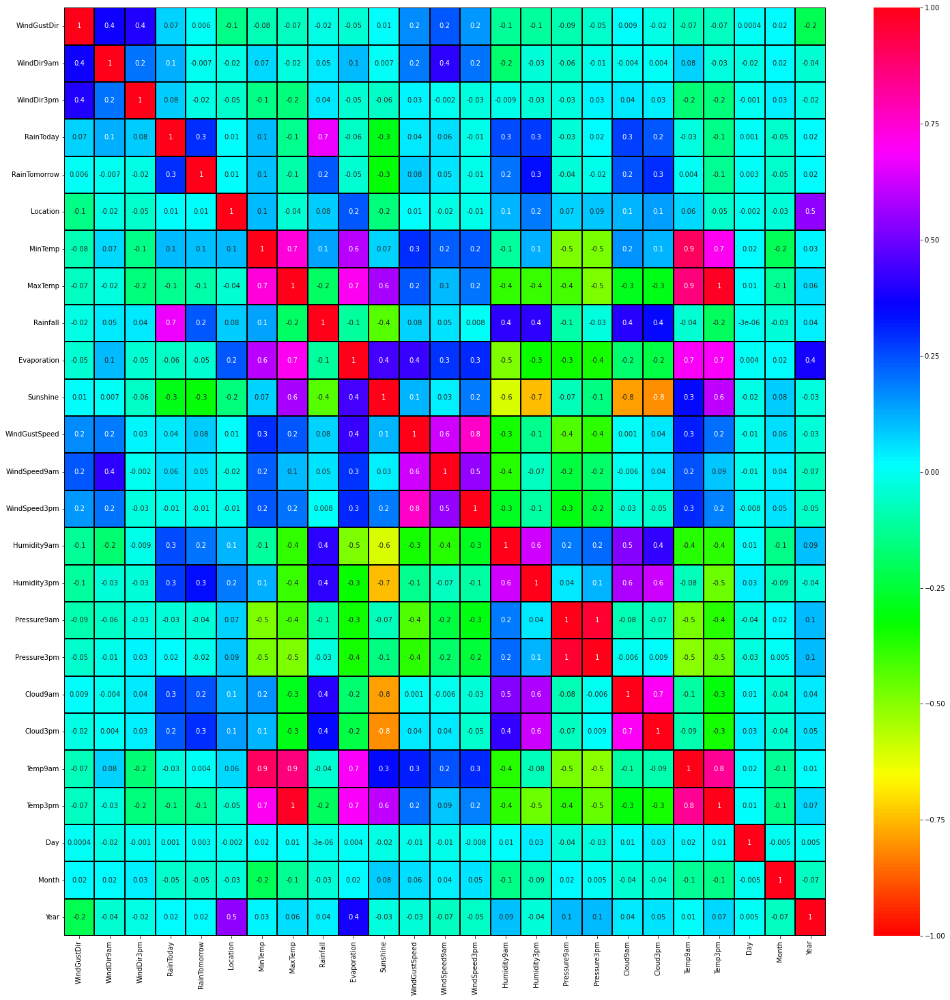

In [226]:
plt.figure(figsize=(25,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="hsv")

# Visualizing the correlation between label and features using bar plot

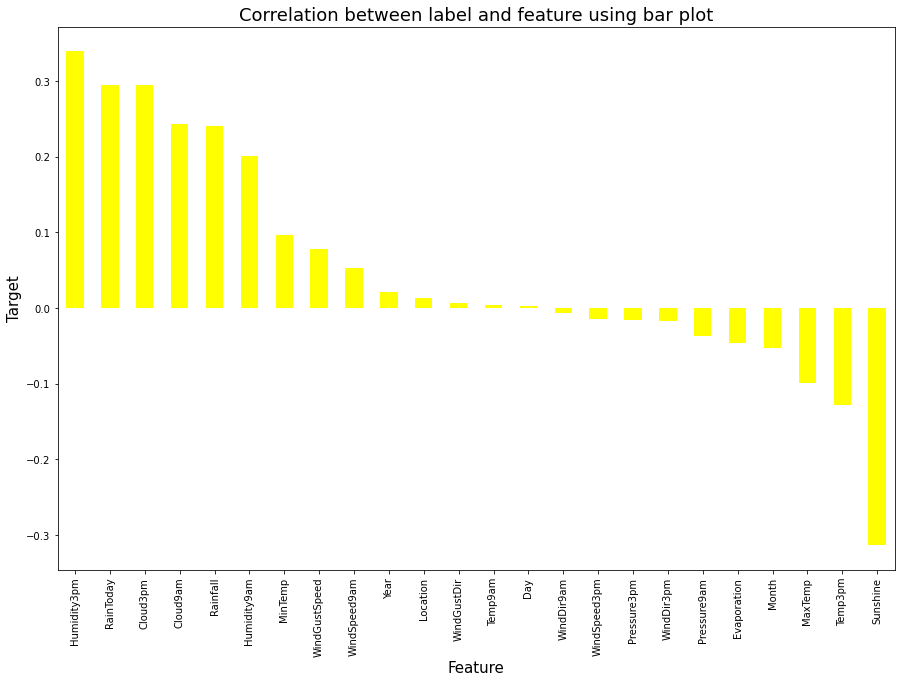

In [227]:
plt.figure(figsize=(15,10))
df_new.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='yellow')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('Correlation between label and feature using bar plot',fontsize=18)
plt.show()

- We can see that 'Humidy3pm' is highly positively correlated and 'Sunshine' is highly negatively correlated with target variable.

# Feature Scaling using Standard Scalarization

In [228]:
from sklearn.preprocessing import StandardScaler

#Separate Label and Features
x=df_new.drop('RainTomorrow',axis=1)
y=df_new.RainTomorrow

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,1.247965,1.213389,1.541063,-0.560882,-1.379334,0.048488,-0.226612,0.806117,-0.449326,-0.154832,...,-1.588149,-1.883671,-1.502182,1.479615,0.327698,-0.202854,-0.185536,-1.668284,1.667302,-1.743795
1,1.441737,-0.358897,1.779808,-0.560882,-1.379334,-1.001527,0.145232,-0.615681,-0.191372,1.435521,...,-1.426422,-1.357451,-1.375007,-1.110178,-1.049117,-0.150355,0.247241,-1.554771,1.667302,-1.743795
2,1.635509,1.213389,1.779808,-0.560882,-1.379334,-0.039013,0.246644,-0.615681,0.390325,1.260313,...,-1.156876,-1.901817,-1.211498,-0.682731,-0.828466,0.514633,0.056819,-1.441258,1.667302,-1.743795
3,-0.495982,0.314940,-1.801369,-0.560882,-1.379334,-0.686522,0.635391,-0.615681,-0.319826,1.569545,...,-1.911604,-0.087263,-0.466621,-1.348008,-1.300868,0.007143,0.628084,-1.327745,1.667302,-1.743795
4,1.247965,-1.481959,-0.130153,-0.560882,-1.379334,0.765999,1.362178,1.168404,-0.272886,-0.270022,...,-0.995149,-1.321159,-1.702027,1.102344,1.584544,-0.045357,1.182039,-1.214232,1.667302,-1.743795


# Checking Variance Inflation Factor(VIF)

In [229]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

#Checking VIF
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,1.475585,WindGustDir
1,1.404584,WindDir9am
2,1.307690,WindDir3pm
3,1.900497,RainToday
4,1.655218,Location
5,12.622109,MinTemp
6,38.589724,MaxTemp
7,2.337321,Rainfall
8,5.093665,Evaporation
9,10.512002,Sunshine


- We can see that 'Temp3pm','MaxTemp' have high VIF values, so we will drop them.

In [230]:
x.drop('Temp3pm',axis=1,inplace=True)

In [231]:
x.drop('MaxTemp',axis=1,inplace=True)

In [232]:
#Checking VIF again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,1.472716,WindGustDir
1,1.388783,WindDir9am
2,1.307333,WindDir3pm
3,1.893401,RainToday
4,1.588982,Location
5,12.278743,MinTemp
6,2.332301,Rainfall
7,4.743480,Evaporation
8,9.469087,Sunshine
9,3.778997,WindGustSpeed


In [233]:
x.drop('Pressure9am',axis=1,inplace=True)

In [234]:
x.drop('Temp9am',axis=1,inplace=True)

In [235]:
#Checking VIF again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,1.472153,WindGustDir
1,1.385660,WindDir9am
2,1.257036,WindDir3pm
3,1.884492,RainToday
4,1.588714,Location
5,3.166507,MinTemp
6,2.260008,Rainfall
7,4.674311,Evaporation
8,8.323290,Sunshine
9,3.715010,WindGustSpeed


##### Now we can see that all VIF values are less than 10, so lets proceed.

### Previously we check, the value counts for target variable and they were imbalances, now lets Clear Oversampling.

In [236]:
# Oversampling the data
from imblearn.over_sampling import SMOTE

SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [237]:
# Checking value count of target column
y.value_counts()

0    3665
1    3665
Name: RainTomorrow, dtype: int64

Now our data in target variable is balanced.

# Model Building

In [238]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [239]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train, y_train)
    pred = RFC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8872214643019555  on Random_state  54


In [240]:
# Creating train_test split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [247]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.impute import KNNImputer
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb

# Feature Importance

,Importance
Features,
Humidity3pm,0.103
Cloud3pm,0.077
Sunshine,0.075
Cloud9am,0.056
Humidity9am,0.052
Pressure3pm,0.050
MinTemp,0.048
WindGustSpeed,0.048
Evaporation,0.046


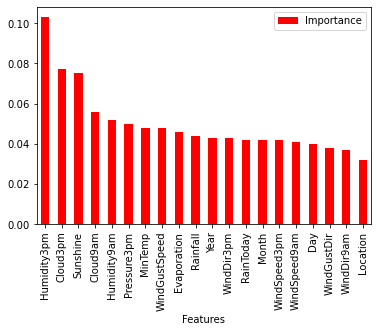

In [248]:
rf=RandomForestClassifier()

rf.fit(x_train, y_train)

importance = pd.DataFrame({'Features':x.columns, 'Importance':np.round(rf.feature_importances_,3)})
importance = importance.sort_values('Importance', ascending=False).set_index('Features')
importance.plot.bar(color='red')
importance

# Building Machine Learning Classification Model

In [260]:
# Classification Model Function

def classify(model, x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=112)
    
    # Training the model
    model.fit(x_train, y_train)
    
    # Predicting Y_test
    pred = model.predict(x_test)
    
    # Classification Report
    class_report = classification_report(y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    # Accuracy Score
    acc_score = (accuracy_score(y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, x, y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

In [261]:
# Logistic Regression

model=LogisticRegression()
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.75      0.73      1099
           1       0.74      0.69      0.71      1100

    accuracy                           0.72      2199
   macro avg       0.72      0.72      0.72      2199
weighted avg       0.72      0.72      0.72      2199

Accuracy Score: 72.26011823556162
Cross Validation Score: 60.28649386084584

Accuracy Score - Cross Validation Score is 11.973624374715783


In [262]:
# Support Vector Classifier

model=SVC(C=1.0, kernel='rbf', gamma='auto', random_state=42)
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.80      0.79      1099
           1       0.79      0.79      0.79      1100

    accuracy                           0.79      2199
   macro avg       0.79      0.79      0.79      2199
weighted avg       0.79      0.79      0.79      2199

Accuracy Score: 79.3087767166894
Cross Validation Score: 57.87175989085949

Accuracy Score - Cross Validation Score is 21.437016825829907


In [263]:
# Decision Tree Classifier

model=DecisionTreeClassifier(random_state=21, max_depth=15)
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.76      0.76      1099
           1       0.76      0.78      0.77      1100

    accuracy                           0.77      2199
   macro avg       0.77      0.77      0.77      2199
weighted avg       0.77      0.77      0.77      2199

Accuracy Score: 76.71668940427467
Cross Validation Score: 53.02864938608458

Accuracy Score - Cross Validation Score is 23.688040018190094


In [264]:
# Random Forest Classifier

model=RandomForestClassifier(max_depth=15, random_state=111)
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.84      0.85      1099
           1       0.85      0.87      0.86      1100

    accuracy                           0.86      2199
   macro avg       0.86      0.86      0.86      2199
weighted avg       0.86      0.86      0.86      2199

Accuracy Score: 85.53888130968622
Cross Validation Score: 57.121418826739436

Accuracy Score - Cross Validation Score is 28.41746248294678


In [265]:
# K Neighbors Classifier

model=KNeighborsClassifier(n_neighbors=15)
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.66      0.73      1099
           1       0.72      0.85      0.78      1100

    accuracy                           0.76      2199
   macro avg       0.77      0.76      0.76      2199
weighted avg       0.77      0.76      0.76      2199

Accuracy Score: 75.89813551614371
Cross Validation Score: 58.69031377899046

Accuracy Score - Cross Validation Score is 17.207821737153253


In [266]:
# Extra Trees Classifier

model=ExtraTreesClassifier()
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.88      0.89      1099
           1       0.88      0.89      0.89      1100

    accuracy                           0.89      2199
   macro avg       0.89      0.89      0.89      2199
weighted avg       0.89      0.89      0.89      2199

Accuracy Score: 88.81309686221009
Cross Validation Score: 62.9331514324693

Accuracy Score - Cross Validation Score is 25.879945429740786


In [267]:
# XGB Classifier

model=xgb.XGBClassifier(verbosity=0)
classify(model, x, y)


Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.90      0.88      1099
           1       0.90      0.85      0.87      1100

    accuracy                           0.88      2199
   macro avg       0.88      0.88      0.88      2199
weighted avg       0.88      0.88      0.88      2199

Accuracy Score: 87.6762164620282
Cross Validation Score: 48.24010914051843

Accuracy Score - Cross Validation Score is 39.436107321509766


# Hyper parameter tuning on the best Classification ML Model

##### From above all the classification models, I am selecting ExtraTree Classifier as my best model.

In [279]:
Parameters = {'criterion' : ['gini', 'entropy', 'log_loss'],
              'n_estimators' : [10,25,40,50,75,100],
              'min_samples_split' : [22.2,33.3,44,4,55.5,77,7],
              'max_depth' : [0, 20, 40,60,80,100],
              'max_features' : ['sqrt', 'log2', 'None']
             }

In [282]:
GSCV = GridSearchCV(ExtraTreesClassifier(), Parameters, cv=11)

In [284]:
GSCV.fit(x_train,y_train)

GridSearchCV(cv=11, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [0, 20, 40, 60, 80, 100],
                         'max_features': ['sqrt', 'log2', 'None'],
                         'min_samples_split': [22.2, 33.3, 44, 4, 55.5, 77, 7],
                         'n_estimators': [10, 25, 40, 50, 75, 100]})

In [285]:
# Now lets get the results

print(GSCV.best_params_)

{'criterion': 'gini', 'max_depth': 100, 'max_features': 'sqrt', 'min_samples_split': 4, 'n_estimators': 100}


In [286]:
Final_Model = ExtraTreesClassifier(criterion='gini', max_features ='sqrt', min_samples_split = 4, n_estimators = 100, max_depth = 100)
Classifier = Final_Model.fit(x_train, y_train)
fmod_pred = Final_Model.predict(x_test)
fmod_acc = (accuracy_score(y_test, fmod_pred))*100
print("Accuracy score for the Best Model is:", fmod_acc)

Accuracy score for the Best Model is: 89.85902683037745


I have successfully completed the Hyper Parameter Tuning on my Final Model and received the accuracy score as 90%.

# AUC ROC Curve

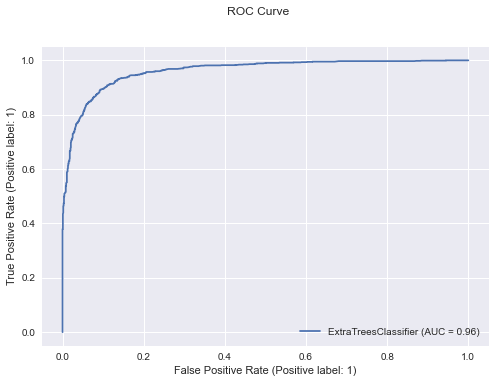

In [287]:
from sklearn import metrics

plt.style.use('seaborn')
disp = metrics.plot_roc_curve(Final_Model, x_test, y_test)
disp.figure_.suptitle("ROC Curve")
plt.show()

AUC-ROC curve gives accuracy score as 96%

# Confusion Matrix

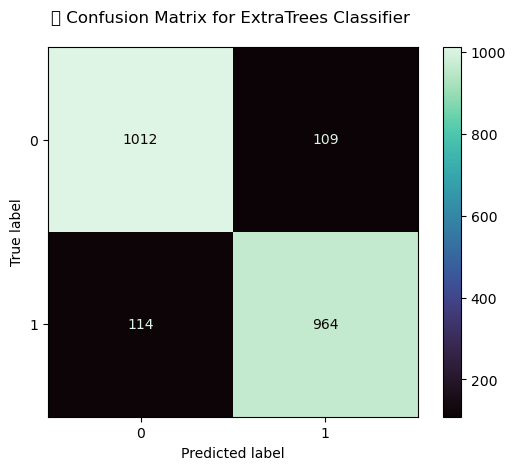

In [288]:
plt.style.use('default')
class_names = df_new.columns
metrics.plot_confusion_matrix(Classifier, x_test, y_test, cmap='mako')
plt.title('\t Confusion Matrix for ExtraTrees Classifier \n')
plt.show()

# Saving the model

In [289]:
import pickle

In [290]:
filename = "Final_RainFall_Prediction.pkl"
pickle.dump(rf, open(filename,'wb'))

# Predicting the saved model

In [291]:
loadmodel = pickle.load(open('Final_RainFall_Prediction.pkl', 'rb'))

In [292]:
a = np.array(y_test)
pred = np.array(model.predict(x_test))
df_final = pd.DataFrame({"Original":a,"Predicted":pred},index=range(len(a)))
df_final

,Original,Predicted
0,1,1
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
2194,1,1
2195,1,1
2196,0,0
2197,0,0


##### The above dataframe has original and predicted data from the best model

# Now let us predict the Rainfall from our data using Regression Model

<AxesSubplot:>

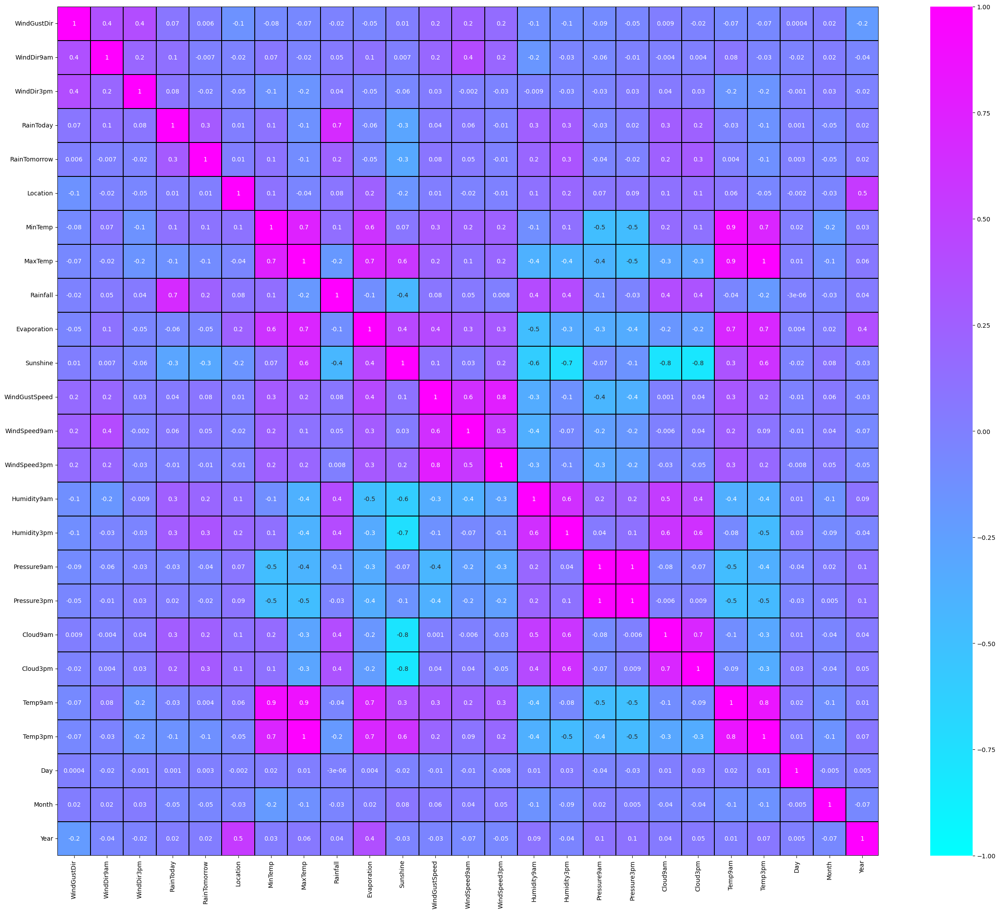

In [294]:
#Finding relation ith Rainfall
plt.figure(figsize=(30,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="cool")

# Visualizing the correlation between label and features using bar plot

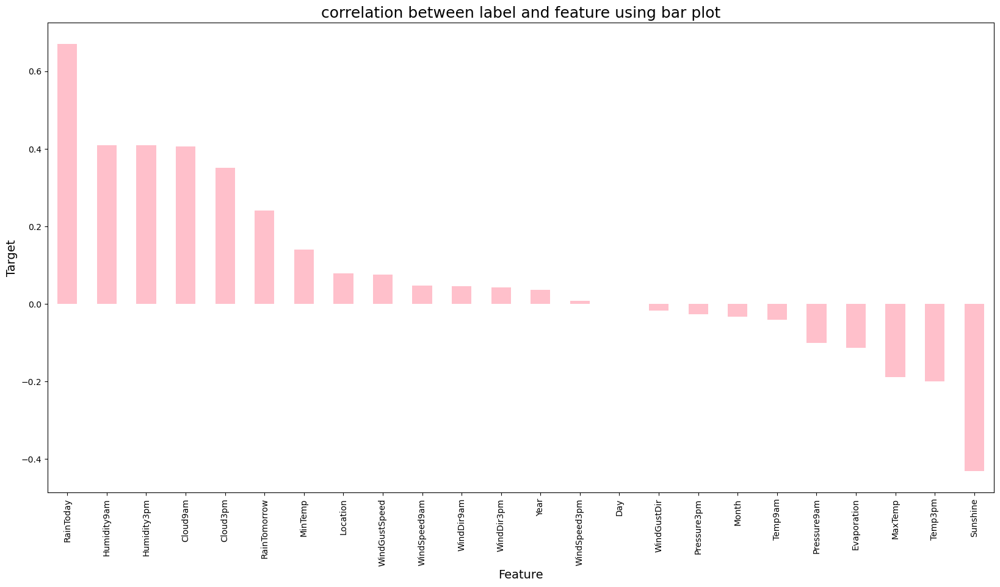

In [295]:
plt.figure(figsize=(20,10))
df_new.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='pink')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

# Separating the features and label variables into x and y

In [300]:
x = df_new.drop("Rainfall", axis=1)
y = df_new["Rainfall"]

# Feature Scaling using Standard Scalarization

In [301]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Evaporation,Sunshine,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,1.247965,1.213389,1.541063,-0.560882,-0.565975,-1.379334,0.048488,-0.226612,-0.449326,-0.154832,...,-1.588149,-1.883671,-1.502182,1.479615,0.327698,-0.202854,-0.185536,-1.668284,1.667302,-1.743795
1,1.441737,-0.358897,1.779808,-0.560882,-0.565975,-1.379334,-1.001527,0.145232,-0.191372,1.435521,...,-1.426422,-1.357451,-1.375007,-1.110178,-1.049117,-0.150355,0.247241,-1.554771,1.667302,-1.743795
2,1.635509,1.213389,1.779808,-0.560882,-0.565975,-1.379334,-0.039013,0.246644,0.390325,1.260313,...,-1.156876,-1.901817,-1.211498,-0.682731,-0.828466,0.514633,0.056819,-1.441258,1.667302,-1.743795
3,-0.495982,0.314940,-1.801369,-0.560882,-0.565975,-1.379334,-0.686522,0.635391,-0.319826,1.569545,...,-1.911604,-0.087263,-0.466621,-1.348008,-1.300868,0.007143,0.628084,-1.327745,1.667302,-1.743795
4,1.247965,-1.481959,-0.130153,-0.560882,-0.565975,-1.379334,0.765999,1.362178,-0.272886,-0.270022,...,-0.995149,-1.321159,-1.702027,1.102344,1.584544,-0.045357,1.182039,-1.214232,1.667302,-1.743795


# Modeling

In [302]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFG = RandomForestRegressor()
    RFG.fit(x_train, y_train)
    pred = RFG.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.7536668628240264  on Random_state  160


In [303]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS) 

In [304]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

# Random Forest Regressor

In [305]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))
print('MAE:',mean_absolute_error(y_test, predRFR))
print('MSE:',mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predRFR)))
# Checking cv score 
print(cross_val_score(RFR,x,y,cv=5).mean())

R2_Score: 0.7460027133733427
MAE: 0.2474705095437097
MSE: 0.15971824622661168
RMSE: 0.3996476525973994
0.46892463393152395


# KNNeighbors Regressor

In [306]:
# Checking R2 score for Stochastic KNN Regressor
knn=KNN()
knn.fit(x_train,y_train)

# prediction
predknn=knn.predict(x_test)
print('R2_Score:',r2_score(y_test,predknn))
print('MAE:',mean_absolute_error(y_test, predknn))
print('MSE:',mean_squared_error(y_test, predknn))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predknn)))
# Checking cv score 
print(cross_val_score(knn,x,y,cv=5).mean())

R2_Score: 0.6107008659239077
MAE: 0.28499564430143554
MSE: 0.24479857945713324
RMSE: 0.49477123952098634
0.3896099502160765


# GradientBoosting Regressor

In [307]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# prediction
predGB=GB.predict(x_test)
print('R2_Score:',r2_score(y_test,predGB))
print('MAE:',mean_absolute_error(y_test, predGB))
print('MSE:',mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predGB)))
# Checking cv score 

print(cross_val_score(GB,x,y,cv=5).mean())

R2_Score: 0.7198976640610801
MAE: 0.2656640617083264
MSE: 0.17613358967058454
RMSE: 0.41968272500852893
0.44608014666587587


# BaggingRegressor

In [308]:
# Checking R2 score for BaggingRegressor
from sklearn.ensemble import BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train,y_train)

# prediction
predBR=BR.predict(x_test)
print('R2_Score:',r2_score(y_test,predBR))
print('MAE:',mean_absolute_error(y_test, predBR))
print('MSE:',mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predBR)))
# Checking cv score
print(cross_val_score(BR,x,y,cv=5).mean())

R2_Score: 0.7109834301073797
MAE: 0.25502181351301045
MSE: 0.18173902676972759
RMSE: 0.42630860508524526
0.42251496859421317


# AdaBoostRegressor

In [309]:
ABR=AdaBoostRegressor()

ABR.fit(x_train,y_train)
# prediction
predABR=ABR.predict(x_test)
print('R2_Score:',r2_score(y_test,predABR))
print('MAE:',mean_absolute_error(y_test, predABR))
print('MSE:',mean_squared_error(y_test, predABR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predABR)))
# Checking cv score
print(cross_val_score(ABR,x,y,cv=5).mean())

R2_Score: 0.3043507346337725
MAE: 0.6162502324219772
MSE: 0.43743727395182236
RMSE: 0.6613904096309701
0.26438135458809614


- I am selecting AdaBoostRegressor as my best model for hyper parameter tuning.

# Hyper parameter tuning

In [310]:
parameter={'n_estimators':[1,3,4,5],
          'learning_rate':[.1,1,.3,.5],
          'loss' : ['linear', 'square', 'exponential'],
          'random_state':[100,150,200,250]}

In [311]:
GCV=GridSearchCV(AdaBoostRegressor(),parameter,cv=4)

In [312]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.1, 1, 0.3, 0.5],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [1, 3, 4, 5],
                         'random_state': [100, 150, 200, 250]})

In [313]:
GCV.best_params_

{'learning_rate': 0.5,
 'loss': 'square',
 'n_estimators': 4,
 'random_state': 150}

In [314]:
Rainfall_model = AdaBoostRegressor(learning_rate= 0.5, loss= 'square',n_estimators= 4,random_state=150)
Rainfall_model.fit(x_train, y_train)
pred = Rainfall_model.predict(x_test)
print("RMSE value:",np.sqrt(mean_squared_error(y_test, pred)))
print('R2_Score:',r2_score(y_test,pred)*100)

RMSE value: 0.4905410257912275
R2_Score: 61.73292969864047


# Saving the model

In [315]:
filename = "Final_RainFall_model.pkl"
pickle.dump(rf, open(filename,'wb'))

# Loading The Model

In [316]:
loadmodel = pickle.load(open('Final_RainFall_model.pkl', 'rb'))

In [320]:
pred = Rainfall_model.predict(x_test)
a = np.array(y_test)
df_final = pd.DataFrame({"Original":a,"Predicted":pred},index=range(len(a)))
df_final

,Original,Predicted
0,-0.775140,-0.572400
1,0.364819,-0.243560
2,-0.640127,-0.711447
3,-0.775140,-0.711447
4,0.852378,1.020702
...,...,...
1447,-0.775140,-0.217144
1448,1.147840,0.924696
1449,-0.775140,-0.711447
1450,-0.775140,-0.543264


# Plot the result

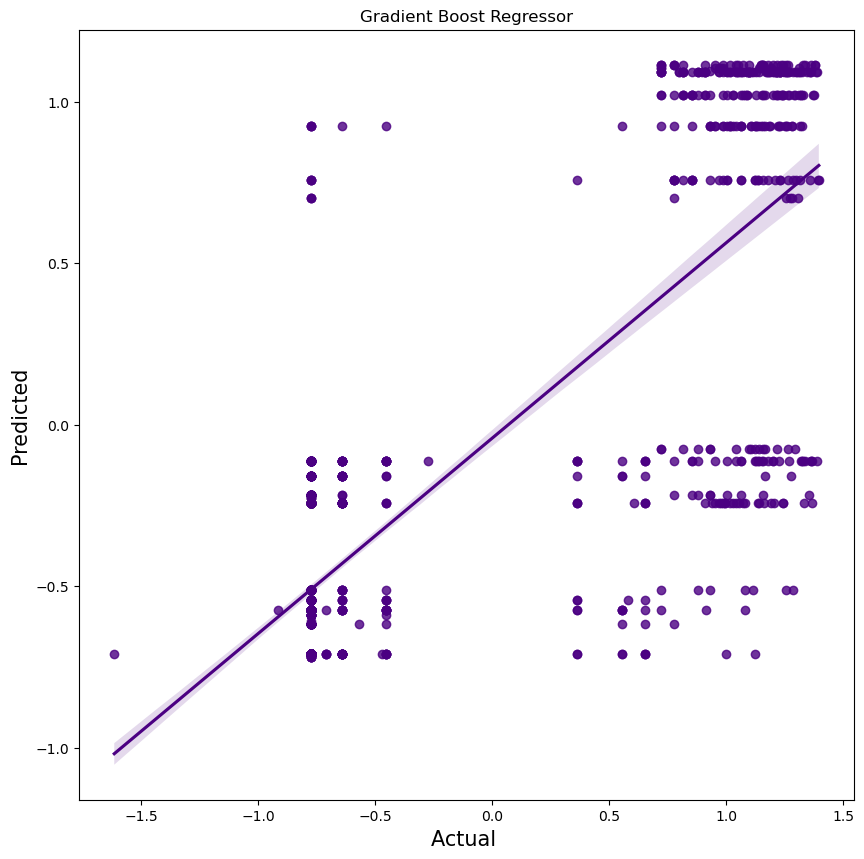

In [321]:
plt.figure(figsize=(10,10))
sns.regplot(y_test,pred,color='indigo')
plt.xlabel('Actual ',fontsize=15)
plt.ylabel('Predicted',fontsize=15)
plt.title("Gradient Boost Regressor")
plt.show()

#  Model1 has accuracy score as 90%
 
#  Model2 has accuracy score as 62%